In [51]:
from nilearn.input_data import NiftiMasker, MultiNiftiMasker
from nilearn.datasets import fetch_atlas_basc_multiscale_2015
from nilearn.image import new_img_like, high_variance_confounds
from fastsrm.identifiable_srm import IdentifiableFastSRM
from nilearn import image, plotting
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import os
import glob
import ibc_public
import pandas as pd

%matplotlib inline

In [2]:
# Specify the mask image
_package_directory = os.path.dirname(os.path.abspath(ibc_public.__file__))
mask_gm = nib.load(os.path.join(_package_directory, '../ibc_data', 'gm_mask_3mm.nii.gz'))

In [3]:
# Task of interest
task = 'raiders'

In [102]:
# Any specific files that should be used for FastSRM
if task == 'clips':
    sessn = 3
    filepattern = 'wrdc*Trn*run-04*.nii.gz'
else:
    sessn = 2
    filepattern = 'wrdc*run-12*.nii.gz'

In [5]:
# Create a masker to standardize (0 mean, 1 SD) the image files
# and to transform them to a 2D array, as FastSRM requires
img_masker = NiftiMasker(mask_img=mask_gm, 
                              standardize=True, 
                              smoothing_fwhm=5,
                              high_pass=1./128,
                              t_r=2.0).fit()

In [103]:
# Now create a list of movie session files 
movie_dir = os.path.join('..', task, '3mm/')
subs = sorted(glob.glob(movie_dir + 'sub*'))
nsub = 0
preproc_file = 'masked_imgs_preproc_run12_confound.npy'
confound_file = 'masked_imgs_confound_run12.npy'

movie_arrays = []

# Create 2D masked arrays from image data and save to file for quick and easy access
for s, sub in enumerate(subs):
    if os.path.isdir(sub):
        nsub += 1
        sess = sorted(glob.glob(sub + '/ses*'))
        ses = sess[1]
       
        if os.path.exists(os.path.join(ses, preproc_file)):
            masked_imgs = np.load(os.path.join(ses, preproc_file), 
                                  allow_pickle=True)
        else:    
            movie_imgs = sorted(glob.glob(ses + '/' + filepattern))
            movie_imgs_confounds = high_variance_confounds(movie_imgs[0])
            np.save(os.path.join(ses, confound_file), movie_imgs_confounds)
            masked_imgs = img_masker.transform(movie_imgs[0], confounds=movie_imgs_confounds)
            np.save(os.path.join(ses, preproc_file), masked_imgs)

        movie_arrays.append(masked_imgs)

In [105]:
# Load the confound files
confounds = []
confound_pattern = '*_confound_*.npy'
for s, sub in enumerate(subs):
    sess = sorted(glob.glob(sub + '/ses*'))
    for i, ses in enumerate(sess):
        files = sorted(glob.glob(ses + '/' + confound_pattern))
        for fi, file in enumerate(files):
            confounds.append(np.load(file, allow_pickle=True))

In [106]:
# The confound files for a particular session should
# all have the same length, irrespective of subject
# Create a list of confound array lengths
clen = np.zeros((nsub,12,5))
for si in range(nsub):
    for sesi in range(12):
        for c in range(5):
            clen[si,sesi,c] = len(confounds[si*12+sesi][:,c])

In [107]:
# Plot the lengths of the confound arrays
si = 0
for i in range(12):
    print(clen[9,i], '\t', clen[8,i], '\t', clen[2,i])

[374. 374. 374. 374. 374.] 	 [374. 374. 374. 374. 374.] 	 [374. 374. 374. 374. 374.]
[297. 297. 297. 297. 297.] 	 [297. 297. 297. 297. 297.] 	 [297. 297. 297. 297. 297.]
[314. 314. 314. 314. 314.] 	 [314. 314. 314. 314. 314.] 	 [314. 314. 314. 314. 314.]
[379. 379. 379. 379. 379.] 	 [379. 379. 379. 379. 379.] 	 [379. 379. 379. 379. 379.]
[347. 347. 347. 347. 347.] 	 [347. 347. 347. 347. 347.] 	 [347. 347. 347. 347. 347.]
[346. 346. 346. 346. 346.] 	 [346. 346. 346. 346. 346.] 	 [346. 346. 346. 346. 346.]
[211. 211. 211. 211. 211.] 	 [211. 211. 211. 211. 211.] 	 [211. 211. 211. 211. 211.]
[375. 375. 375. 375. 375.] 	 [375. 375. 375. 375. 375.] 	 [375. 375. 375. 375. 375.]
[314. 314. 314. 314. 314.] 	 [314. 314. 314. 314. 314.] 	 [314. 314. 314. 314. 314.]
[350. 350. 350. 350. 350.] 	 [350. 350. 350. 350. 350.] 	 [350. 350. 350. 350. 350.]
[353. 353. 353. 353. 353.] 	 [353. 353. 353. 353. 353.] 	 [353. 353. 353. 353. 353.]
[281. 281. 281. 281. 281.] 	 [281. 281. 281. 281. 281.] 	 [281. 2

In [108]:
# Load the motion parameters files
motion = []
motion_pattern = 'rp*.txt'
for s, sub in enumerate(subs):
    sess = sorted(glob.glob(sub + '/ses*'))
    for i, ses in enumerate(sess):
        files = sorted(glob.glob(ses + '/' + motion_pattern))
        for fi, file in enumerate(files):
            motion.append(np.loadtxt(file))

In [109]:
# The confound files for a particular session should
# all have the same length, irrespective of subject
# Create a list of confound array lengths
mlen = np.zeros((nsub,12))
for si in range(nsub):
    for sesi in range(12):
        mlen[si,sesi] = len(motion[si*12+sesi])

In [110]:
# Plot the lengths of the motion arrays
for si in range(nsub):
    print(mlen[si,0], ' ', mlen[si,1], ' ', mlen[si,2], ' ', mlen[si,3], ' ', mlen[si,4], ' ', mlen[si,5])
    print(mlen[si,6], ' ', mlen[si,7], ' ', mlen[si,8], ' ', mlen[si,9], ' ', mlen[si,10], ' ', mlen[si,11])

379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
378.0   346.0   347.0   375.0   297.0   314.0
379.0   347.0   346.0   374.0   297.0   314.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
378.0   346.0   347.0   375.0   297.0   314.0
379.0   347.0   346.0   374.0   297.0   314.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   350.0   353.0
379.0   347.0   346.0   374.0   297.0   314.0
281.0   211.0   375.0   297.0   35

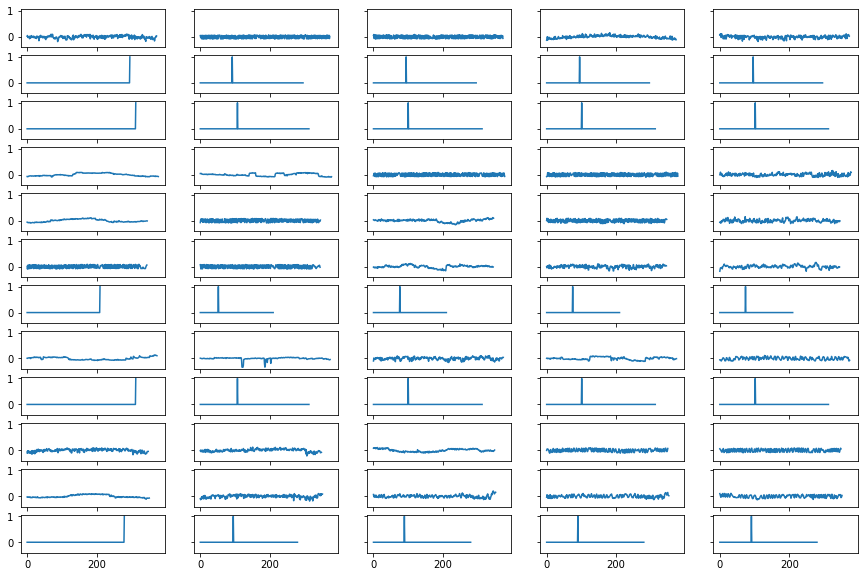

In [111]:
fig, axs = plt.subplots(12, 5, figsize=(15,10), sharex=True, sharey=True)
si = 0
for sesi in range(12):
    for c in range(5):
        axs[sesi,c].plot(confounds[si*12+sesi][:,c])

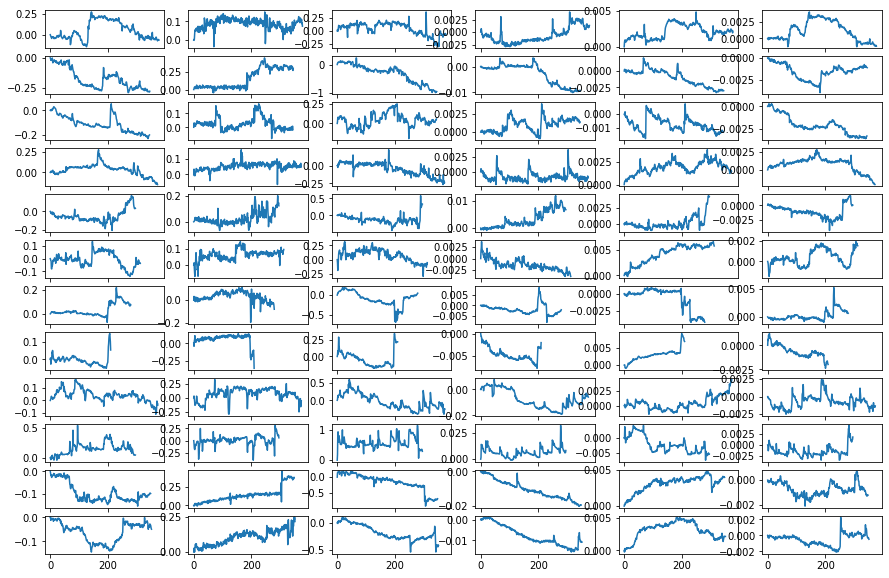

In [113]:
# Load the motion parameters file related to the above session
fig, axs = plt.subplots(12, 6, figsize=(15,10), sharex=True)
m_sess = [3, 4, 5, 0, 1, 2, 11, 6, 7, 8, 9, 10]
si = 0
for sesi in m_sess:
    for c in range(6):
        axs[sesi,c].plot(motion[si*12+sesi][:,c])

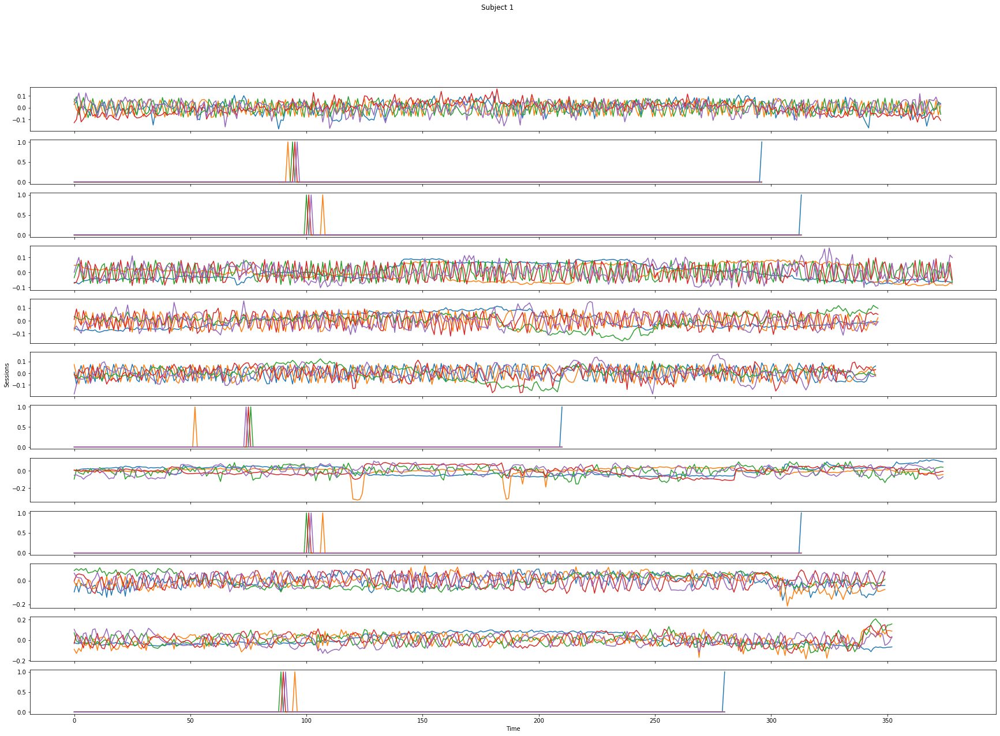

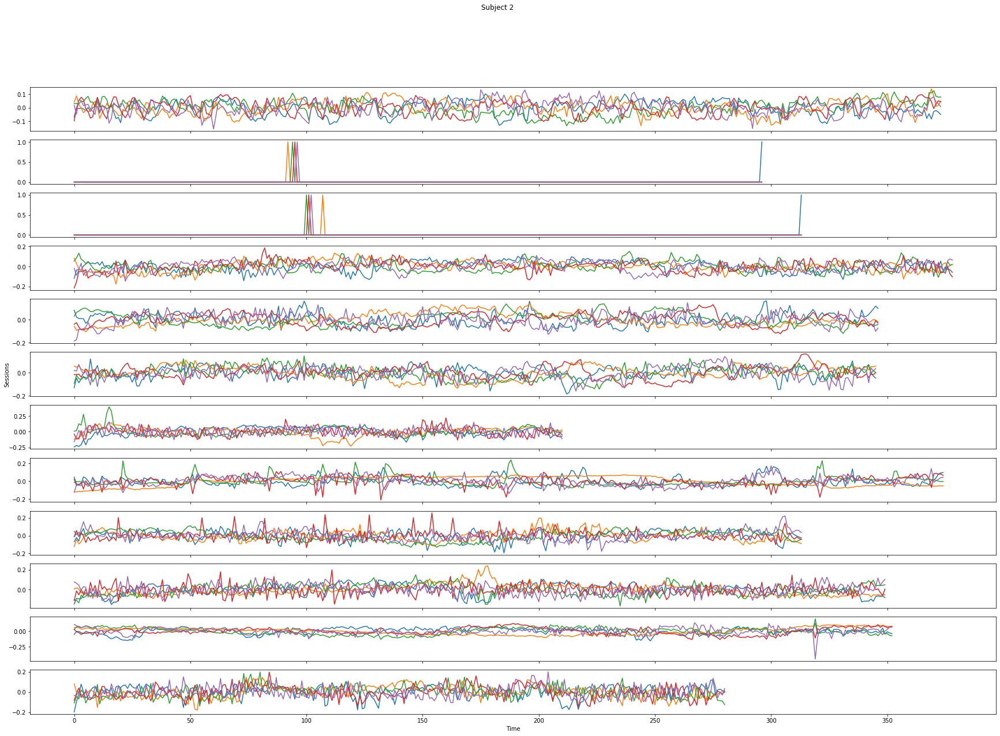

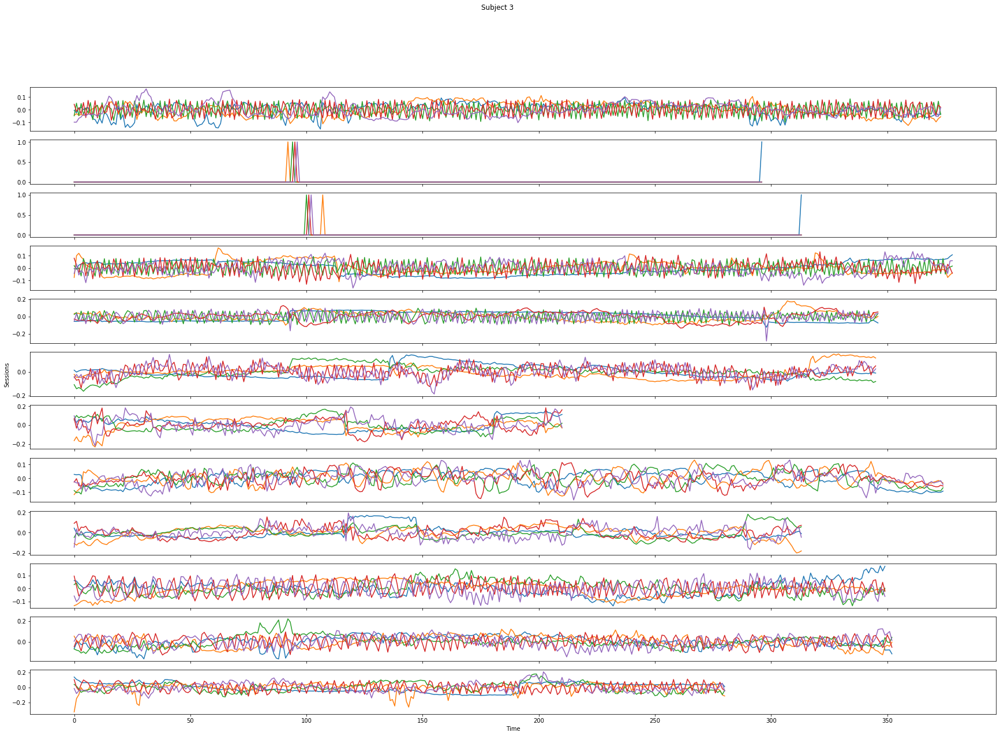

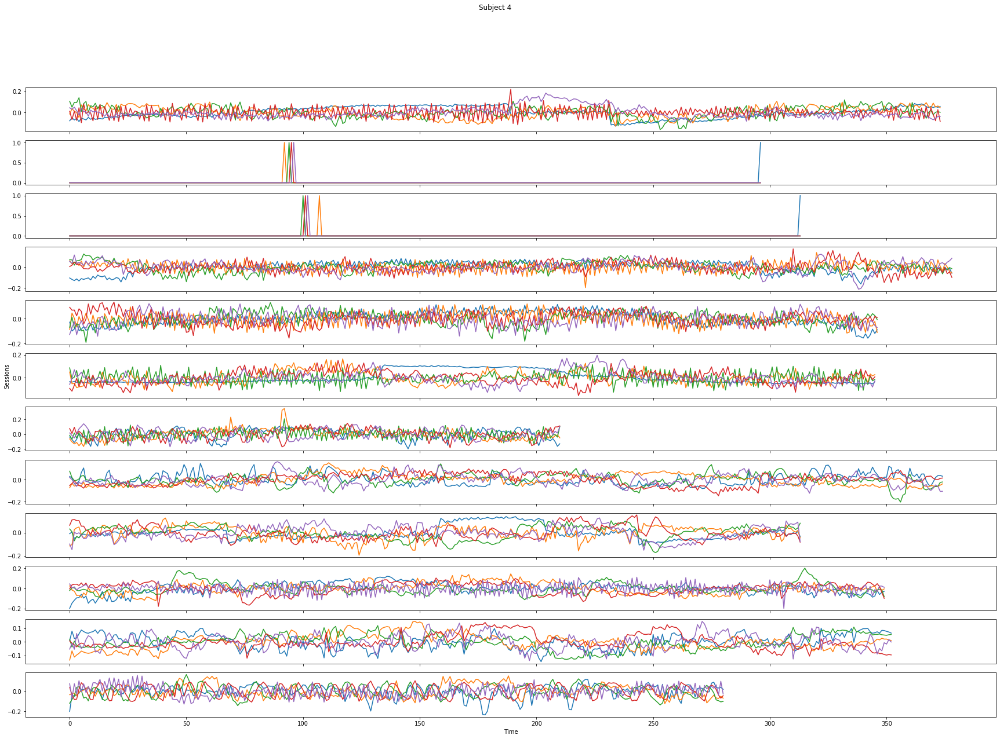

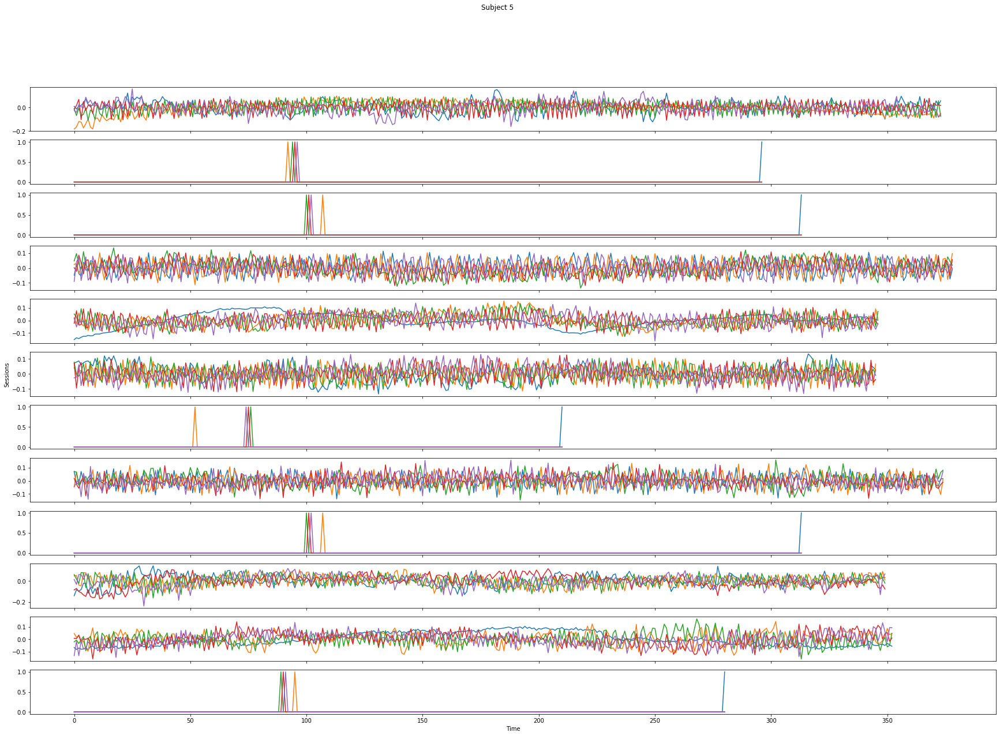

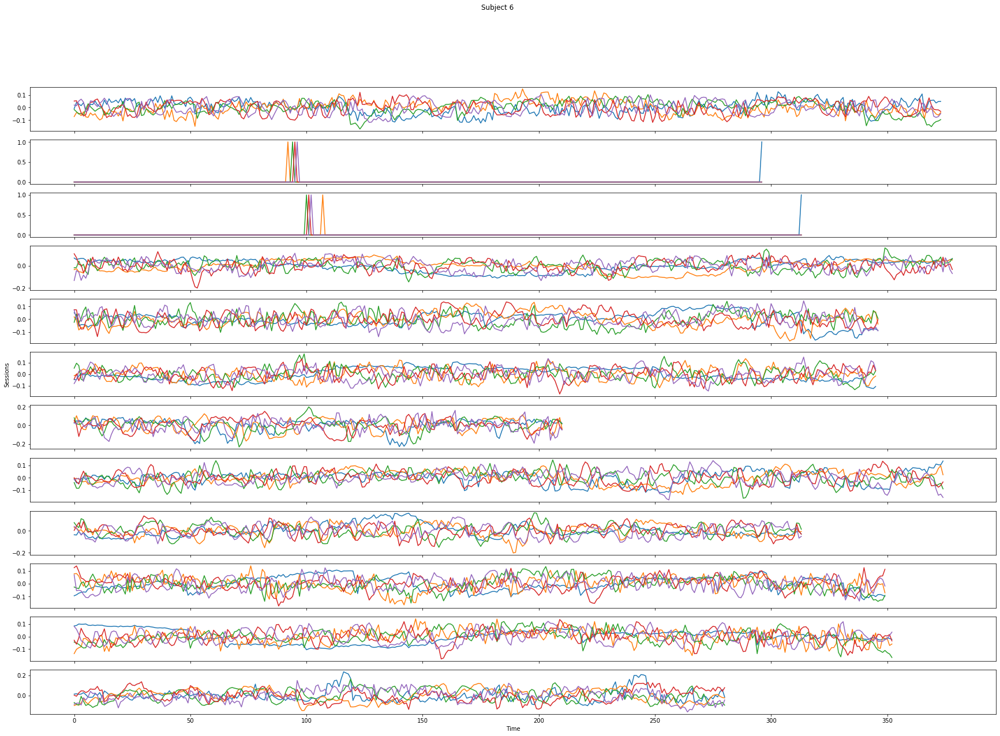

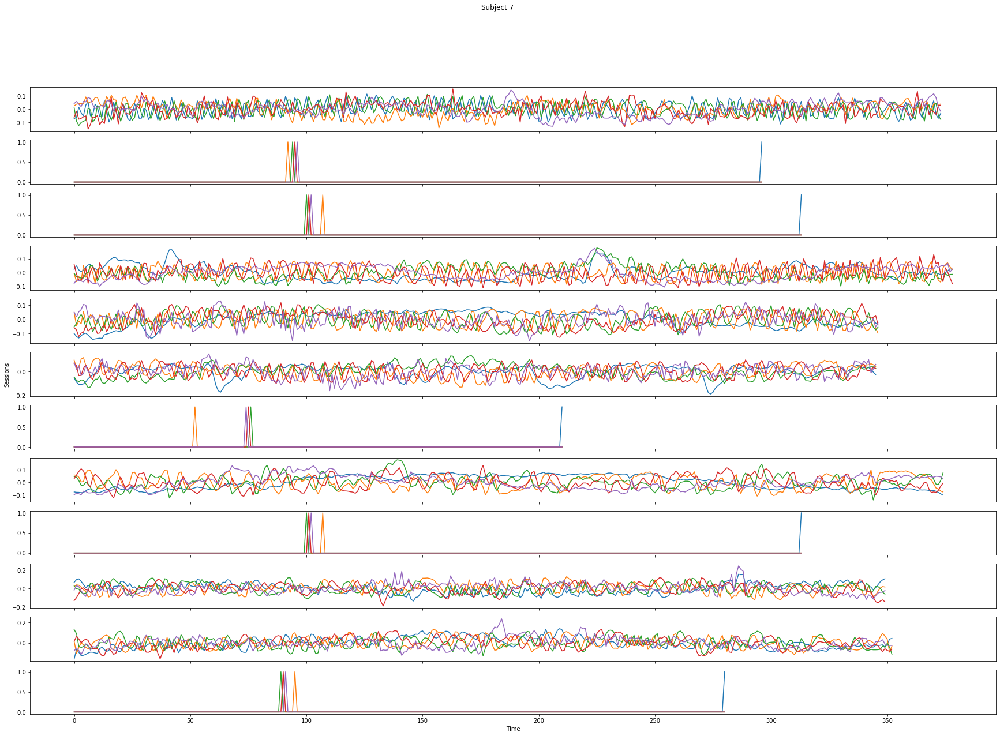

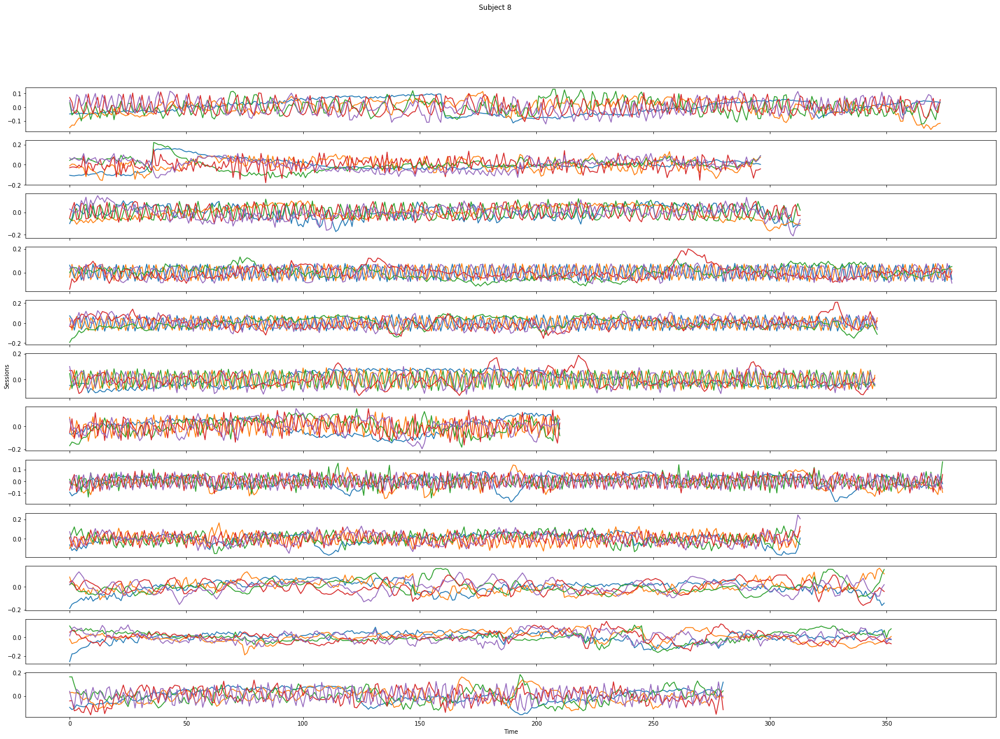

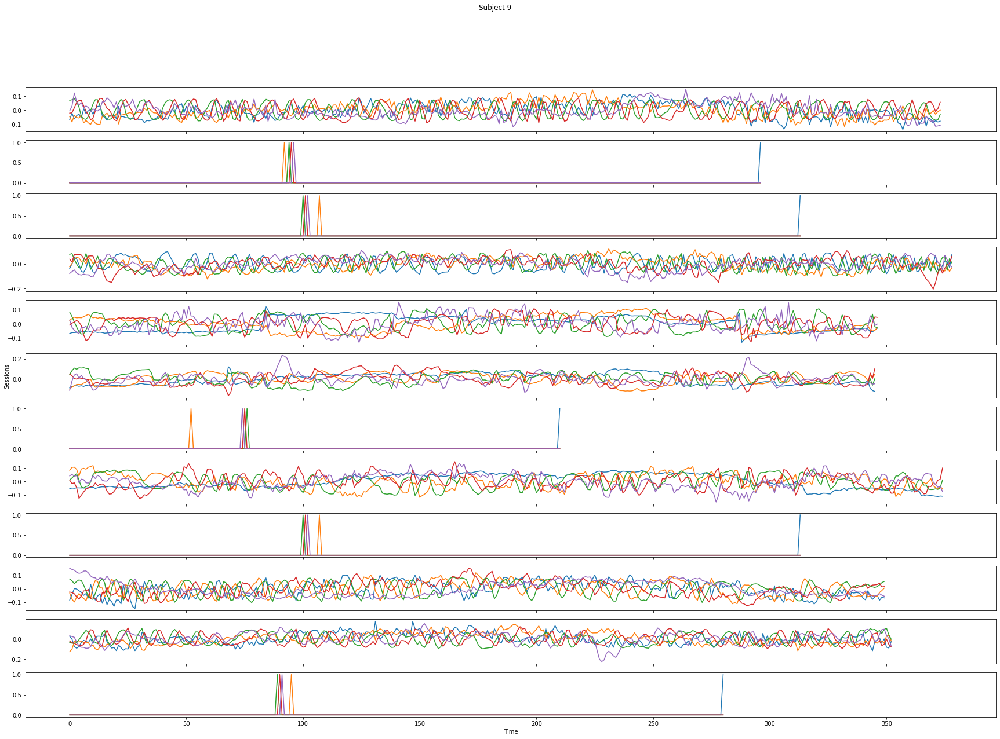

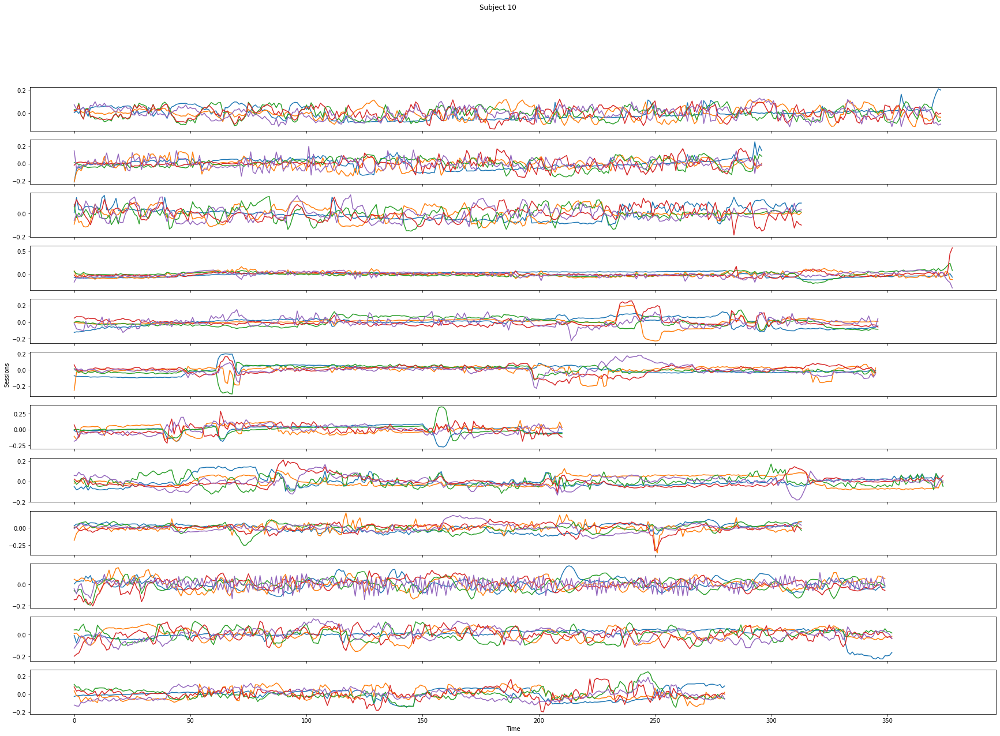

In [50]:
for si in range(10):
    fig, axs = plt.subplots(12, figsize=(30,20), sharex=True)
    fig.suptitle('Subject ' + str(si+1))
    for sesi in range(12):
        for c in range(5):
            axs[sesi].plot(confounds[si*12+sesi][:,c])
        if sesi==11:
            axs[sesi].set_xlabel('Time')
        if sesi==5:
            axs[sesi].set_ylabel('Sessions')
            
    fig.savefig(os.path.join(movie_dir, 'confounds', 'sub-'+str(si+1)+'.pdf'), 
                format='pdf', transparent=False)

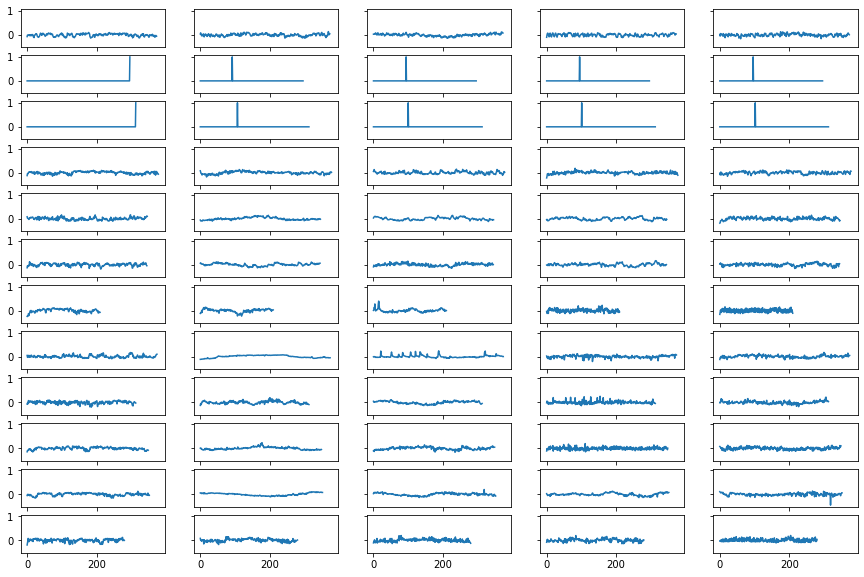

In [27]:
fig, axs = plt.subplots(12, 5, figsize=(15,10), sharex=True, sharey=True)
for si in range(1,2):
    for sesi in range(12):
        for c in range(5):
            axs[sesi,c].plot(confounds[si*12+sesi][:,c])

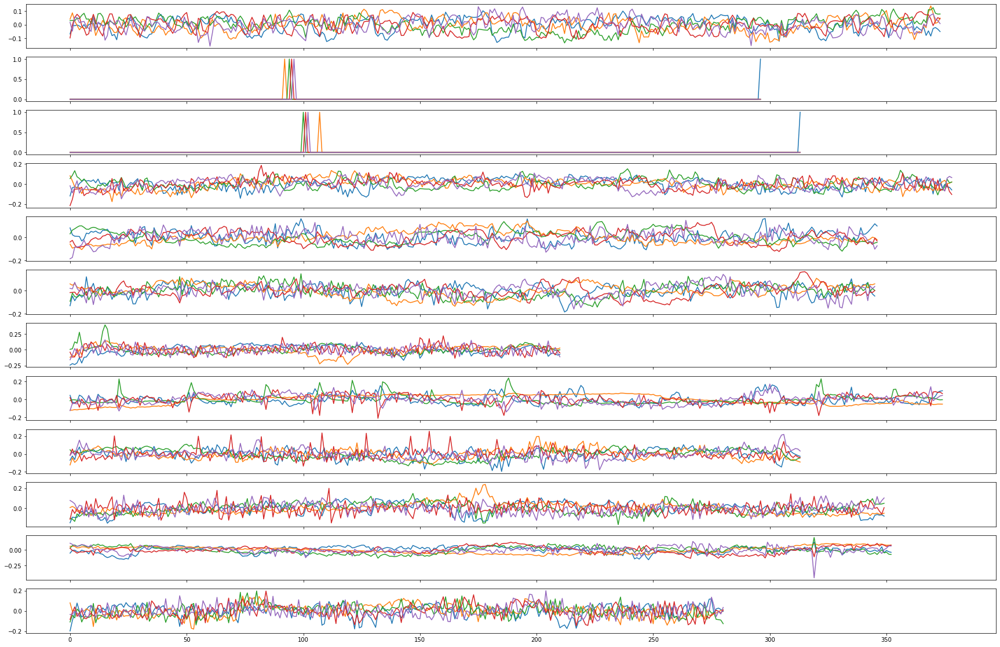

In [34]:
fig, axs = plt.subplots(12, figsize=(30,20), sharex=True)
for si in range(1,2):
    for sesi in range(12):
        for c in range(5):
            axs[sesi].plot(confounds[si*12+sesi][:,c])

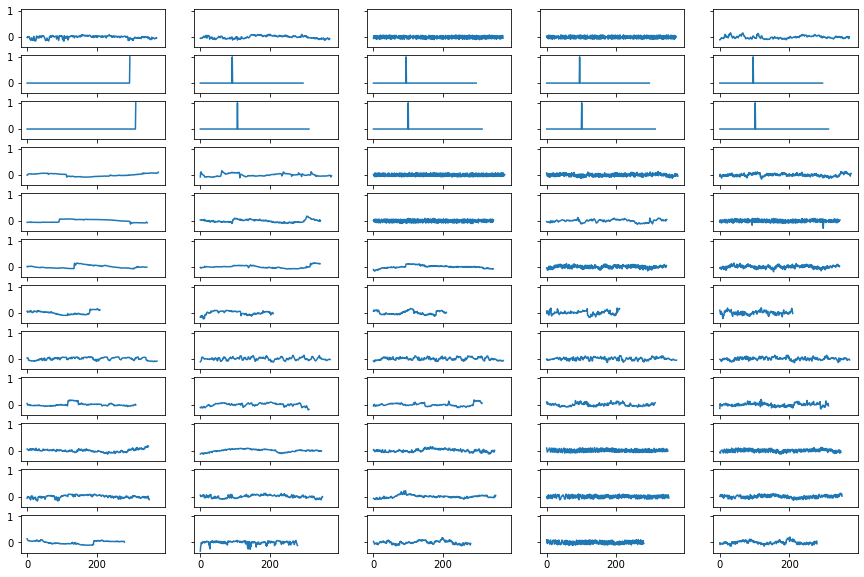

In [29]:
fig, axs = plt.subplots(12, 5, figsize=(15,10), sharex=True, sharey=True)
for si in range(2,3):
    for sesi in range(12):
        for c in range(5):
            axs[sesi,c].plot(confounds[si*12+sesi][:,c])

In [ ]:
# This is what the high-variance confounds look like for the last subject
fig, axs = plt.subplots(5, sharex=True, sharey=True, 
                        figsize=(10,10))
for i in range(5):
    axs[i].plot(movie_imgs_confounds[:,i])
    axs[i].set_title('Confound #' + str(i+1))

In [ ]:
for i in range(len(subs)):
    print(movie_arrays[i].shape)

In [ ]:
# Create a list with all subjects' data
sub_movie = []

for i in range(0, nsub):
    sub_movie.append(movie_arrays[i].T)

In [ ]:
sub_movie[0].shape

In [ ]:
# Do this for a previously unused atlas. 
# Else, you should have a .npy file saved from before, and you can just load it.
# The transform() funtion takes a few minutes to run so don't run it 
# unless you absolutely need to.

# Now, a bit of shape shifting to make the atlas compatible with
# what fastsrm.reduce_data() requires.
# 1. Add a 4th dimension to the 3D atlas. The 4th dimension will have as many
#   elements as atlas parcesl (444, in this case)
# 2. The 3D "volume" pertaining to each 4th dimension will contain 1 in the
#   "voxel" for that parcel and 0 otherwise
# 3. Apply the atlas masker set up previously to transform the new 4D atlas
#   into 2D, with n_voxel rows and n_parcel columns,
#   where n_voxel is the number of voxels in the transformed image matrix
# 4. Reduce the 2D atlas matrix to 1D by using the argmax function along the
#   column dimension. Now, the transformed atlas has n_voxel elements.

atlas_loc = os.path.join('..', task, '3mm')
if os.path.exists(os.path.join(atlas_loc, 'atlas_masked.npy')):
    atlas = np.load(os.path.join(atlas_loc, 'atlas_masked.npy'), allow_pickle=True)
else:
    # Specify the atlas
    basc444 = fetch_atlas_basc_multiscale_2015()['scale444']
    basc_im = image.load_img(basc444).get_data()

    atlas_masker = NiftiMasker(mask_img=mask_gm).fit()

    if len(basc_im.shape) == 3:
        n_components = len(np.unique(basc_im)) - 1
        xa, ya, za = basc_im.shape
        A = np.zeros((xa, ya, za, n_components + 1))
        atlas = np.zeros((xa, ya, za, n_components + 1))
        for c in np.unique(basc_im)[1:].astype(int):
            X_ = np.copy(basc_im)
            X_[X_ != c] = 0.
            X_[X_ == c] = 1.
            A[:, :, :, c] = X_
        atlas = atlas_masker.transform(new_img_like(basc444, A))
        atlas = np.argmax(atlas, axis=0)

    # # Save the transformed atlas
    np.save(os.path.join(atlas_loc, 'atlas_masked.npy'), atlas)

In [ ]:
# Fit the FastSRM model with the data
fast_srm = IdentifiableFastSRM(
    atlas=atlas,
    n_components=20,
    n_jobs=1,
    n_iter=1000,
    n_iter_reduced=1000,
    temp_dir='/tmp',
    low_ram=True, 
    aggregate="mean",
    identifiability='decorr'
)
fast_srm.fit(sub_movie)

In [ ]:
# Compute the shared temporal responses of subjects while watching the movie
shared_resp = fast_srm.transform(sub_movie)

In [ ]:
# These are what the shared responses look like
fig, axs = plt.subplots(20, sharex=True, sharey=True, 
                        figsize=(10,50))
# gridspec_kw={'hspace': 0.2}
for i in range(len(shared_resp)):
    axs[i].plot(shared_resp[i,:])
    axs[i].set_title('Shared response #' + str(i+1))